# SNP Importance Analysis V5: 干净版Manhattan图

本版本实现完整的SNP重要性分析和Manhattan图绘制：

## 两种方法
1. **Enrichment**: 基于Utility的富集分数
2. **Combined v2**: 基于Enrichment + 相对强度比例放大（仅对显著点）

## 放大逻辑
- 相对强度 = |enriched_corr| / median(|enriched_corr|)
- 在显著点中映射：[rel_min, rel_max] → [1, 1+AMPLIFICATION_STRENGTH]
- 最终分数 = 基础分数 × 放大倍数

## 参数
- WINDOW_SIZE: 局部密度计算的窗口大小
- OVERLAY_SMOOTHING_RATIO: 趋势线平滑参数
- AMPLIFICATION_STRENGTH: 放大倍数范围（0-1）

In [329]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import rankdata, pearsonr
from scipy.ndimage import gaussian_filter1d
from IPython.display import display
import warnings
warnings.filterwarnings('ignore')

# Matplotlib配置
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['Arial', 'DejaVu Sans', 'Liberation Sans']
plt.rcParams['axes.unicode_minus'] = False
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
plt.rcParams['font.size'] = 10
plt.rcParams['axes.titlesize'] = 11
plt.rcParams['axes.labelsize'] = 10
plt.rcParams['xtick.labelsize'] = 9
plt.rcParams['ytick.labelsize'] = 9
plt.rcParams['legend.fontsize'] = 9
plt.style.use('seaborn-v0_8-whitegrid')

print('Libraries loaded')

Libraries loaded


In [330]:
# ============== 配置 ==============
BASE_DIR = '/mnt/HTT_3T/github orign code/Whisper_of_DNA_pl'
RUN_DIR = f'{BASE_DIR}/logs0/DNAWhisperfinetune/run0_blockembedding_f3p_30k'

USE_SPLIT = 'train'
WEIGHTS_NPY = f'{RUN_DIR}/snp_weights_output/snp_weights_{USE_SPLIT}.npy'
PHENO_NPY = f'{RUN_DIR}/snp_weights_output/predictions_phenotype_labels_{USE_SPLIT}.npy'
SNP_META = f'{RUN_DIR}/maize1404_preprocessed_newtry_kept_snp_indices_20250527_133445.txt'
OUTPUT_DIR = f'{RUN_DIR}/manhattan_enrichment_clean_v5'

EXPERT_IDS = [0, 1, 2]

# ============== 可配置参数 ==============
WINDOW_SIZE = 25  # 滑动窗口大小（SNP数量，用于局部密度计算）
OVERLAY_SMOOTHING_RATIO = 0.05  # 富集趋势线高斯平滑参数（染色体SNP数量的比例）
AMPLIFICATION_STRENGTH = 10.0  # 1+x范围内的放大强度

os.makedirs(OUTPUT_DIR, exist_ok=True)

print(f'Configuration:')
print(f'  Split: {USE_SPLIT}')
print(f'  Window Size: {WINDOW_SIZE} SNPs (for local density)')
print(f'  Overlay Smoothing: {OVERLAY_SMOOTHING_RATIO*100}% of chr SNPs')
print(f'  Amplification Strength: {AMPLIFICATION_STRENGTH} (range [1, 1+{AMPLIFICATION_STRENGTH}])')
print(f'  Output: {OUTPUT_DIR}')

Configuration:
  Split: train
  Window Size: 25 SNPs (for local density)
  Overlay Smoothing: 5.0% of chr SNPs
  Amplification Strength: 10.0 (range [1, 1+10.0])
  Output: /mnt/HTT_3T/github orign code/Whisper_of_DNA_pl/logs0/DNAWhisperfinetune/run0_blockembedding_f3p_30k/manhattan_enrichment_clean_v5


In [331]:
# ============== 加载数据 ==============
def load_weights_and_labels():
    if not os.path.exists(WEIGHTS_NPY) or not os.path.exists(PHENO_NPY):
        raise FileNotFoundError('Missing weights or phenotype labels')
    w = np.load(WEIGHTS_NPY)
    p = np.load(PHENO_NPY)
    print(f'Loaded: weights {w.shape}, phenotype {p.shape}')
    return w, p

def load_snp_metadata(snp_indices_file):
    snp_indices = pd.read_csv(snp_indices_file, header=None, names=['index'])
    print(f'SNP count: {len(snp_indices)}')
    
    BIM_FILE = f'{BASE_DIR}/data/maize1404_genotype/cubic_1404_qc_ldpruned.bim'
    if os.path.exists(BIM_FILE):
        bim_df = pd.read_csv(BIM_FILE, sep='\t', header=None,
                            names=['Chromosome', 'SNP_ID', 'genetic_pos', 'Position', 'allele1', 'allele2'])
        snp_meta = bim_df.iloc[snp_indices['index'].values].reset_index(drop=True)
        print(f'Loaded SNP metadata: {snp_meta.shape}')
        return snp_meta[['SNP_ID', 'Chromosome', 'Position']]
    
    print('Using simplified metadata')
    snp_meta = pd.DataFrame({
        'SNP_ID': [f'SNP_{i}' for i in snp_indices['index']],
        'Chromosome': 1,
        'Position': range(len(snp_indices))
    })
    return snp_meta

weights, phenotype_labels = load_weights_and_labels()
snp_meta = load_snp_metadata(SNP_META)
print(f'SNP metadata shape: {snp_meta.shape}')

Loaded: weights (982, 3, 30976), phenotype (982, 3)
SNP count: 30976
Loaded SNP metadata: (30976, 6)
SNP metadata shape: (30976, 3)


In [332]:
def compute_snp_importance(weights, phenotype_labels, expert_indices=None, epsilon=1e-12):
    B, E, S = weights.shape
    if expert_indices is None:
        expert_indices = list(range(E))
    expert_names = {0: 'DTA', 1: 'DTS', 2: 'DTT'}
    results = {}

    def min_max_norm(x):
        x_min, x_max = np.min(x), np.max(x)
        if x_max - x_min < epsilon:
            return np.ones_like(x) * 0.5
        return (x - x_min) / (x_max - x_min + epsilon)

    for expert_idx in expert_indices:
        name = expert_names.get(expert_idx, f'Expert_{expert_idx}')
        w = weights[:, expert_idx, :]
        y = phenotype_labels[:, expert_idx]

        # Utility：与当前版本一致
        snp_mean = np.mean(w, axis=0)      # [S]
        snp_median = np.median(w, axis=0)  # [S]
        anomaly_log = np.log10((snp_mean + epsilon) / (snp_median + epsilon))

        window_size = int(WINDOW_SIZE) if 'WINDOW_SIZE' in globals() else 50
        local_baseline = np.empty(S)
        for i in range(S):
            s = max(0, i - window_size)
            e = min(S, i + window_size + 1)
            local_baseline[i] = np.mean(snp_median[s:e])
        level_log = np.log10((snp_mean + epsilon) / (local_baseline + epsilon))

        anomaly_norm = min_max_norm(anomaly_log)
        level_norm = min_max_norm(level_log)
        utility_combined = (anomaly_norm**1) * (level_norm**1)  # [0,1]

        median_combined = np.median(utility_combined) + epsilon
        threshold = median_combined / 5
        utility_combined = np.where(utility_combined < threshold, median_combined, utility_combined)
        utility = np.log10((utility_combined + epsilon) / median_combined)

        utility_exp = np.exp(utility)
        utility_norm = (utility_exp - utility_exp.min()) / (utility_exp.max() - utility_exp.min() + epsilon)

        # 原始 corr（保留以兼容后续流程）
        corr = np.zeros(S)
        for i in range(S):
            r, _ = pearsonr(w[:, i], y)
            corr[i] = r

        # corrloc：|corr| / median(|corr|_window)，取 log 输出
        local_corr_med = np.empty(S)
        abs_corr = np.abs(corr)
        for i in range(S):
            s = max(0, i - window_size)
            e = min(S, i + window_size + 1)
            local_corr_med[i] = np.median(abs_corr[s:e]) + epsilon
        corrloc_ratio = abs_corr / local_corr_med
        corrloc_log = np.log10(corrloc_ratio + epsilon)
        corrloc_norm = min_max_norm(corrloc_log)

        # score：minmax(utility) * minmax(corrloc)，再按 utility 的逻辑转成相对比率的 log 输出
        score_mm =  (anomaly_norm**1) * (level_norm**1) * (corrloc_norm**1) # [0,1]     # utility_norm * corrloc_norm  # [0,1]
        score_median = np.median(score_mm) + epsilon
        score_threshold = score_median / 5
        score_mm_adj = np.where(score_mm < score_threshold, score_median, score_mm)
        score_log = np.log10((score_mm_adj + epsilon) / score_median)

        # 经验 p 值与 -log10(p)（基于新的 score_log）
        rank_asc = rankdata(score_log, method='average')
        rank_desc = S + 1 - rank_asc
        empirical_p = rank_desc / (S + 1)
        neg_log10_p = -np.log10(empirical_p)

        results[f'expert_{expert_idx}'] = {
            'expert_name': name,
            'utility': utility,  #utility, score_log
            'utility_normalized': utility_norm,
            'correlation': corr,   # corrloc_norm  corr      # 保留原始 corr
            'corrloc': corrloc_log,         # 你需要的 corrloc（log 输出）
            'corrloc_normalized': corrloc_norm,
            'score': score_log,             # 乘后转相对比率 log 输出
            'empirical_p': empirical_p,
            'neg_log10_p': neg_log10_p
        }

    return results

importance_results = compute_snp_importance(weights, phenotype_labels, EXPERT_IDS)
print('Importance calculation complete')

for expert_key, res in importance_results.items():
    expert_name = res['expert_name']
    score = res['score']
    corr = res['correlation']
    print(f"{expert_name}: score range {np.min(score):.2e} to {np.max(score):.2e}, pos={np.sum(corr>0)}, neg={np.sum(corr<0)}")

Importance calculation complete
DTA: score range -6.93e-01 to 1.71e+00, pos=15323, neg=15653
DTS: score range -6.98e-01 to 1.69e+00, pos=15479, neg=15497
DTT: score range -6.89e-01 to 1.64e+00, pos=15416, neg=15560


In [333]:
# ============== 计算富集相关性 ==============
def compute_enriched_correlationold(meta_df, correlation_scores, utility_scores, window_size=15, epsilon=1e-12):
    """计算Enriched Correlation和Enrichment Score"""
    df = meta_df.copy()
    df['chr_num'] = pd.to_numeric(df['Chromosome'], errors='coerce').fillna(1).astype(int)
    df['pos_numeric'] = pd.to_numeric(df['Position'], errors='coerce').fillna(0)
    df = df.sort_values(['chr_num', 'pos_numeric']).reset_index(drop=True)
    
    n = len(df)
    enriched_corr = np.zeros(n)
    enrichment_score = np.zeros(n)
    
    for chr_val in df['chr_num'].unique():
        mask = df['chr_num'] == chr_val
        idxs = np.where(mask)[0]
        chr_corr = correlation_scores[mask]
        chr_util = utility_scores[mask]
        
        for i, idx in enumerate(idxs):
            s = max(0, i - window_size)
            e = min(len(idxs), i + window_size + 1)
            
            # 计算相关性富集
            w_corr_abs = np.abs(chr_corr[s:e])
            med_corr = np.mean(w_corr_abs) + epsilon
            corr_smooth = chr_corr[i] / med_corr
            
            # 应用局部密度权重
            top_k = max(1, len(w_corr_abs) // 2)
            top_vals = np.partition(w_corr_abs, -top_k)[-top_k:]
            density_corr = np.mean(w_corr_abs)
            enriched_corr[idx] = corr_smooth * (1 + density_corr)
            
            # 计算Utility富集
            w_util = chr_util[s:e]
            top_k_util = max(1, len(w_util) // 2)
            top_vals_util = np.partition(w_util, -top_k_util)[-top_k_util:]
            density_util = np.mean(w_util)
            enrichment_score[idx] = chr_util[i] * (1 + 1.0*density_corr + 1.0*density_util)
    
    # 归一化
    if np.abs(enriched_corr).max() > 0:
        enriched_corr /= np.abs(enriched_corr).max()
    if enrichment_score.max() > 0:
        enrichment_score /= enrichment_score.max()
    
    return enriched_corr, enrichment_score

print('Enrichment functions defined')


Enrichment functions defined


In [334]:
def compute_enriched_correlation(meta_df, correlation_scores, utility_scores, window_size=15, epsilon=1e-12):
    """计算Enriched Correlation和Enrichment Score"""
    df = meta_df.copy()
    df['chr_num'] = pd.to_numeric(df['Chromosome'], errors='coerce').fillna(1).astype(int)
    df['pos_numeric'] = pd.to_numeric(df['Position'], errors='coerce').fillna(0)
    df = df.sort_values(['chr_num', 'pos_numeric']).reset_index(drop=True)
    
    n = len(df)
    corr_ratio_raw = np.zeros(n)  # 存储原始比值
    enriched_corr = np.zeros(n)
    enrichment_score = np.zeros(n)
    
    # ========== 第一遍：计算原始相关性比值 ==========
    for chr_val in df['chr_num'].unique():
        mask = df['chr_num'] == chr_val
        idxs = np.where(mask)[0]
        chr_corr = correlation_scores[mask]
        
        for i, idx in enumerate(idxs):
            s = max(0, i - window_size)
            e = min(len(idxs), i + window_size + 1)
            w_corr_abs = np.abs(chr_corr[s:e])
            med_corr = np.mean(w_corr_abs) + epsilon
            corr_ratio_raw[idx] = np.abs(chr_corr[i]) / med_corr  # 取绝对值！
    
    # ========== 全局归一化 corr_ratio 到 [0, 1] ==========
    ratio_min = corr_ratio_raw.min()
    ratio_max = corr_ratio_raw.max()
    if ratio_max > ratio_min:
        corr_smooth = (corr_ratio_raw - ratio_min) / (ratio_max - ratio_min + epsilon)
    else:
        corr_smooth = np.ones(n) * 0.5
    
    # ========== 第二遍：计算密度权重和最终分数 ==========
    for chr_val in df['chr_num'].unique():
        mask = df['chr_num'] == chr_val
        idxs = np.where(mask)[0]
        chr_corr_smooth = corr_smooth[mask]
        chr_util = utility_scores[mask]
        
        for i, idx in enumerate(idxs):
            s = max(0, i - window_size)
            e = min(len(idxs), i + window_size + 1)
            
            # 用归一化后的 corr_smooth 计算相关性密度
            w_corr_smooth = chr_corr_smooth[s:e]
            density_corr = np.mean(w_corr_smooth)  # ∈ [0, 1]
            enriched_corr[idx] = corr_smooth[idx] * (1 + density_corr)
            
            # 用utility独立计算utility密度
            w_util = chr_util[s:e]
            density_util = np.mean(w_util)  # ∈ [0, 1]
            enrichment_score[idx] = chr_util[i] * (1 + density_corr + enriched_corr[idx])
    
    # ========== 最终归一化 ==========
    if enriched_corr.max() > 0:
        enriched_corr /= enriched_corr.max()
    if enrichment_score.max() > 0:
        enrichment_score /= enrichment_score.max()
    
    return enriched_corr, enrichment_score

print('Enrichment functions defined')

Enrichment functions defined


In [335]:
# ============== 计算所有专家的富集分数 ==============
enrichment_results = {}

for expert_key, res in importance_results.items():
    name = res['expert_name']
    tmp = snp_meta.copy()
    tmp['chr_num'] = pd.to_numeric(tmp['Chromosome'], errors='coerce').fillna(1).astype(int)
    tmp['pos_numeric'] = pd.to_numeric(tmp['Position'], errors='coerce').fillna(0)
    tmp = tmp.sort_values(['chr_num', 'pos_numeric']).reset_index(drop=True)
    
    enr_corr, enr_score = compute_enriched_correlationold(
        tmp, res['correlation'], res['utility_normalized'], window_size=3
    )
    # _normalized
    enrichment_results[expert_key] = {
        'expert_name': name,
        'enrichment_score': enr_score,
        'enriched_correlation': enr_corr,
        'original_correlation': res['correlation']
    }

print(f'Enrichment computations complete (Window size: {WINDOW_SIZE} SNPs)')
for expert_key, res in enrichment_results.items():
    print(f"  {res['expert_name']}: enrichment & correlation computed")

Enrichment computations complete (Window size: 25 SNPs)
  DTA: enrichment & correlation computed
  DTS: enrichment & correlation computed
  DTT: enrichment & correlation computed


In [336]:
# ============== Manhattan图绘制函数 ==============
def plot_manhattan(base_df, neg_log10_pvalues, title, save_path, overlay_series=None, smoothing_ratio=0.05):
    """绘制曼哈顿图（彩色版，与rMVP风格一致）"""
    fig, ax = plt.subplots(figsize=(12, 6))
    df = base_df.copy()
    df['neg_log10_p'] = neg_log10_pvalues
    
    chromosomes = sorted(df['chr_num'].unique())
    # chr_colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b',
    #               '#e377c2', '#7f7f7f', '#bcbd22', '#17becf', '#1f77b4', '#ff7f0e',
    #               '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f']
    chr_colors = ["#4197D8", "#F8C120", "#413496", "#495226", "#D60C7B", 
          "#E28131", "#D486B2", "#92D7BB", "#7B1A2A", "#246D52"]

# 在绘制时根据染色体 ID 取索引
# color = RMVP_COLORS[(chr_id - 1) % len(RMVP_COLORS)]
    x_tick_positions, x_tick_labels = [], []
    x_offset = 0
    sig_threshold = 3.0
    chr_gap = 100
    
    overlay_arr = np.asarray(overlay_series) if overlay_series is not None else None
    
    for i, chr_val in enumerate(chromosomes):
        chr_df = df[df['chr_num'] == chr_val].sort_values('pos_numeric')
        if chr_df.empty:
            continue
        
        n = len(chr_df)
        x = np.arange(n)
        x_abs = x_offset + x
        y = chr_df['neg_log10_p'].values
        chr_color = chr_colors[i % len(chr_colors)]
        
        sig_mask = y > sig_threshold
        non_sig_mask = ~sig_mask
        
        # 非显著点
        if non_sig_mask.any():
            ax.scatter(x_abs[non_sig_mask], y[non_sig_mask], s=30, color=chr_color,
                       alpha=0.55, edgecolors='none', rasterized=True, zorder=1)
        
        # 显著点
        if sig_mask.any():
            ax.scatter(x_abs[sig_mask], y[sig_mask], s=120, color=chr_color,
                       alpha=0.95, edgecolors='black', linewidths=1.0, zorder=3)
        
        # 趋势线
        if overlay_arr is not None:
            mask_chr = (df['chr_num'].to_numpy() == chr_val)
            overlay_chr = overlay_arr[mask_chr]
            if len(overlay_chr) == n and n > 1:
                sm = gaussian_filter1d(overlay_chr, sigma=max(1, int(n * smoothing_ratio)))
                sm_scaled = sm * (np.max(y) * 0.6) if np.max(y) > 0 else sm
                ax.plot(x_abs, sm_scaled, color='#333333', linewidth=2.0,
                        alpha=0.6, zorder=2, label='Enrichment trend' if i == 0 else None)
        
        x_tick_positions.append(x_offset + n / 2)
        x_tick_labels.append(str(int(chr_val)))
        x_offset += n + chr_gap
    
    # 增大字体
    ax.set_xlabel('Chromosome', fontsize=16, fontweight='bold')
    ax.set_ylabel('-log10(Empirical P-value)', fontsize=16, fontweight='bold')
    ax.set_title(title, fontsize=16, pad=12, fontweight='bold')
    ax.set_xticks(x_tick_positions)
    ax.set_xticklabels(x_tick_labels, fontsize=16, fontweight='bold')
    ax.tick_params(axis='y', labelsize=16)
    
    # 阈值线
    ax.axhline(y=sig_threshold, color='#999999', linestyle='--', linewidth=1.5, alpha=0.6, zorder=2, label='Threshold (p=0.001)')
    
    # 图例更清晰
    ax.grid(True, which='major', linestyle='-', linewidth=0.3, alpha=0.25, zorder=0)
    ax.set_axisbelow(True)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_linewidth(1.2)
    ax.spines['bottom'].set_linewidth(1.2)
    
    legend = ax.legend(loc='lower left', fontsize=16, frameon=True, fancybox=False, 
                      edgecolor='black', framealpha=0.98, title='Legend', title_fontsize=12)
    legend.get_frame().set_linewidth(1.2)
    
    plt.tight_layout()
    
    display(fig)
    plt.savefig(save_path, dpi=300, bbox_inches='tight', facecolor='white')
    plt.close(fig)
    print(f'  Saved: {os.path.basename(save_path)}')

print('Plot function defined (with colorful scheme matching rMVP)')

Plot function defined (with colorful scheme matching rMVP)



=== DTA ===


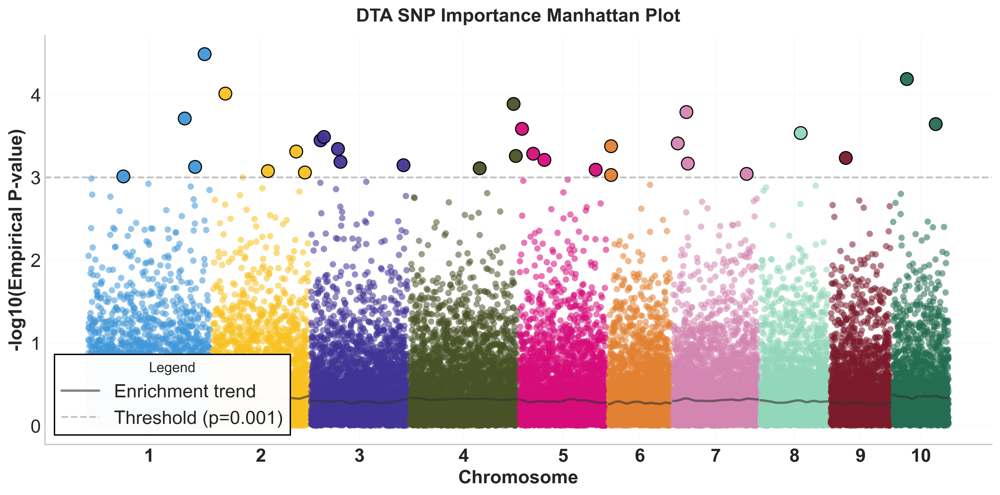

  Saved: manhattan_enrichment_DTA.png


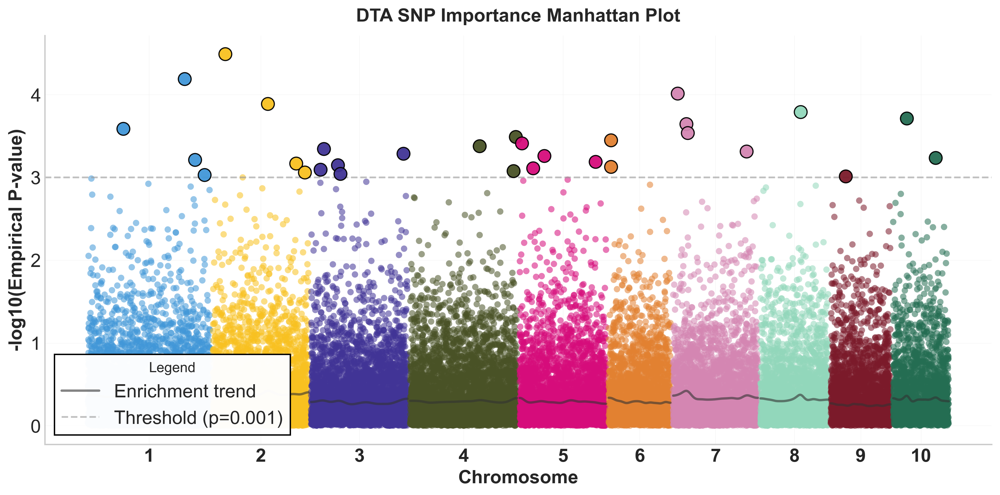

  Saved: manhattan_combined_v2_DTA.png

=== DTS ===


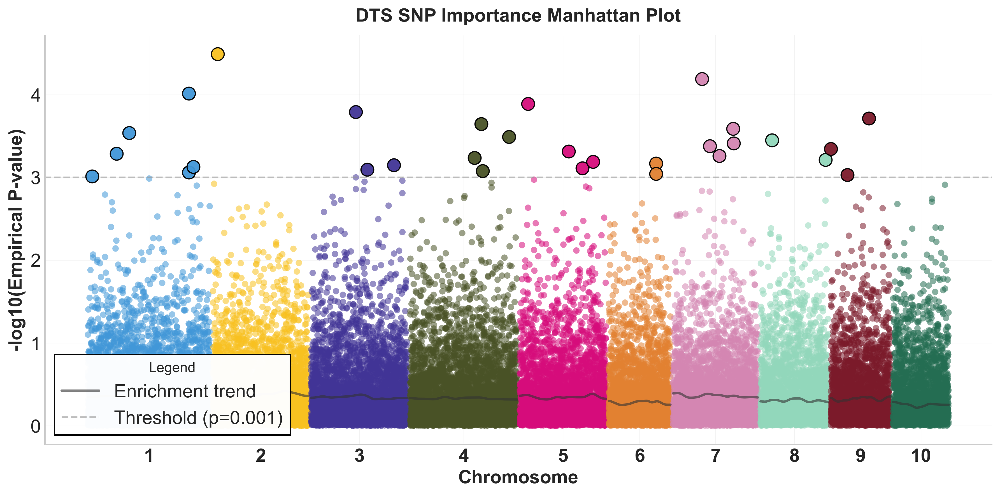

  Saved: manhattan_enrichment_DTS.png


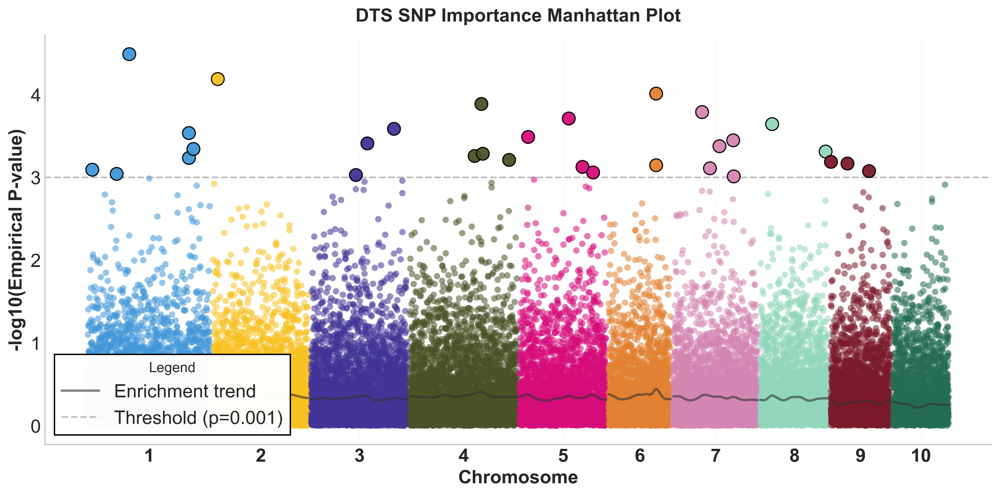

  Saved: manhattan_combined_v2_DTS.png

=== DTT ===


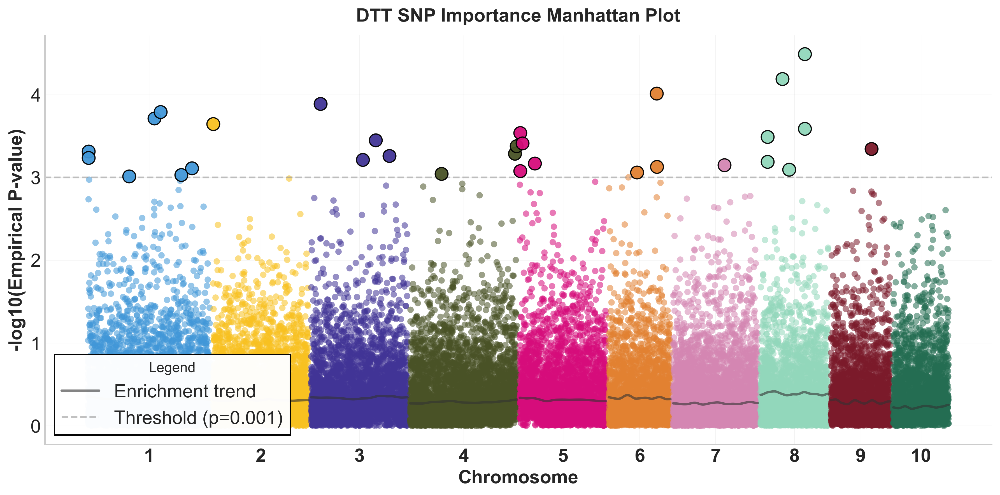

  Saved: manhattan_enrichment_DTT.png


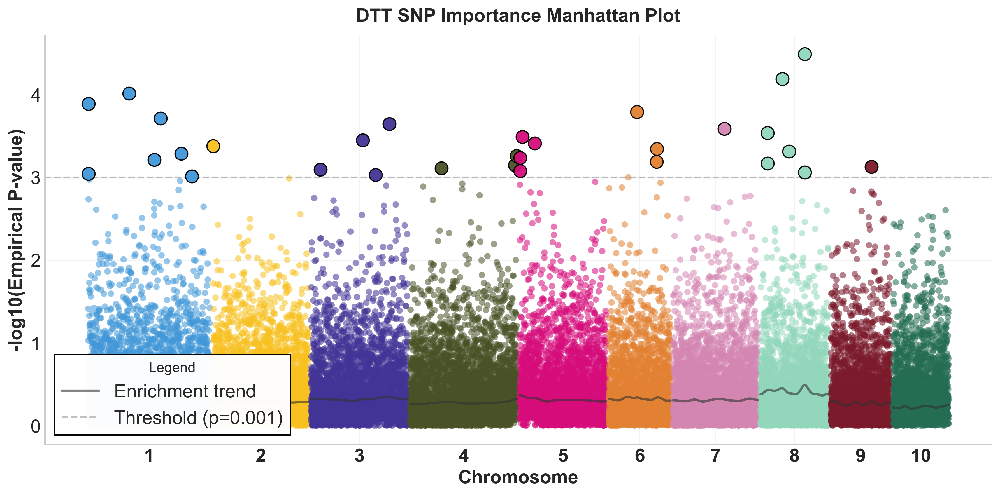

  Saved: manhattan_combined_v2_DTT.png

Manhattan plots generation complete!
Output: /mnt/HTT_3T/github orign code/Whisper_of_DNA_pl/logs0/DNAWhisperfinetune/run0_blockembedding_f3p_30k/manhattan_enrichment_clean_v5/manhattan_plots_clean


In [337]:
# ============== 生成曼哈顿图 ==============
manhattan_dir = os.path.join(OUTPUT_DIR, 'manhattan_plots_clean')
os.makedirs(manhattan_dir, exist_ok=True)

def to_pvals(score):
    """转换分数为Empirical p-value"""
    r = rankdata(score, method='average')
    return (len(score) + 1 - r) / (len(score) + 1)

for expert_key, enrich_res in enrichment_results.items():
    name = enrich_res['expert_name']
    print(f'\n=== {name} ===')
    
    base_df = snp_meta.copy()
    base_df['chr_num'] = pd.to_numeric(base_df['Chromosome'], errors='coerce').fillna(1).astype(int)
    base_df['pos_numeric'] = pd.to_numeric(base_df['Position'], errors='coerce').fillna(0)
    base_df = base_df.sort_values(['chr_num', 'pos_numeric']).reset_index(drop=True)
    
    # ========== 方法1: Enrichment基础 ==========
    p_enr = to_pvals(enrich_res['enrichment_score'])
    neg_log10_p_enr = -np.log10(p_enr)
    
    plot_manhattan(base_df, neg_log10_p_enr,
        title=f'{name} SNP Importance Manhattan Plot',
        save_path=os.path.join(manhattan_dir, f'manhattan_enrichment_{name}.png'),
        overlay_series=enrich_res['enrichment_score'],
        smoothing_ratio=OVERLAY_SMOOTHING_RATIO)
    
    # ========== 方法2: Combined v2（加放大） ==========
    # 步骤1: 先修正分数
    sig_threshold = 3.0
    sig_mask = neg_log10_p_enr > sig_threshold
    
    # 修正enrichment_score分数本身
    adjusted_score = enrich_res['enrichment_score'].copy()
    
    if sig_mask.any():
        # 计算显著点中的相对强度
        abs_enr_corr = np.abs(enrich_res['enriched_correlation'])
        median_enr_corr = np.median(abs_enr_corr)
        
        if median_enr_corr > 0:
            # 显著点的相对强度
            relative_strength = abs_enr_corr[sig_mask] / median_enr_corr
            
            # 在显著点中找相对强度的min和max
            rel_min = relative_strength.min()
            rel_max = relative_strength.max()
            
            # 归一化相对强度到[0, 1]
            if rel_max > rel_min:
                normalized_strength = (relative_strength - rel_min) / (rel_max - rel_min)
            else:
                normalized_strength = np.ones_like(relative_strength) * 0.5
            
            # 映射到放大倍数[1, 1+AMPLIFICATION_STRENGTH]
            amplification_factor = 1 + normalized_strength * AMPLIFICATION_STRENGTH
            
            # 步骤2: 应用放大到分数本身
            adjusted_score[sig_mask] = enrich_res['enrichment_score'][sig_mask] * amplification_factor
    
    # 步骤3: 用修正后的分数重新计算p值
    p_v2 = to_pvals(adjusted_score)
    neg_log10_p_v2 = -np.log10(p_v2)
    
    plot_manhattan(base_df, neg_log10_p_v2,
        title=f'{name} SNP Importance Manhattan Plot',
        save_path=os.path.join(manhattan_dir, f'manhattan_combined_v2_{name}.png'),
        overlay_series=adjusted_score,
        smoothing_ratio=OVERLAY_SMOOTHING_RATIO)
    
    # 保存Top50
    for method_name, neg_log10_p in [('enrichment', neg_log10_p_enr), ('combined_v2', neg_log10_p_v2)]:
        tmp = base_df.copy()
        tmp['neg_log10_p'] = neg_log10_p
        top50 = tmp.nlargest(50, 'neg_log10_p')[['SNP_ID', 'Chromosome', 'Position', 'neg_log10_p']]
        top50.to_csv(os.path.join(manhattan_dir, f'top50_snps_{method_name}_{name}.csv'), index=False)

print('\n' + '='*70)
print('Manhattan plots generation complete!')
print(f'Output: {manhattan_dir}')
print('='*70)

In [338]:
# ============== 总结 ==============
print('\n' + '='*70)
print('ANALYSIS COMPLETE (V5 - Clean Version)')
print('='*70)
print(f"Output directory: {OUTPUT_DIR}")
print(f"Window size: {WINDOW_SIZE} SNPs")
print(f"Overlay smoothing ratio: {OVERLAY_SMOOTHING_RATIO*100}%")
print(f"Amplification strength: {AMPLIFICATION_STRENGTH}")
print()
print('Generated outputs:')
print('  - 6 Manhattan plots (2 methods × 3 experts)')
print('  - 6 Top50 SNP CSV files')
print()
print('Two methods:')
print('  1. Enrichment: 基于Utility的富集分数')
print('  2. Combined v2: Enrichment + 相对强度比例放大')
print()
print('Amplification logic (for Combined v2):')
print('  - 相对强度 = |enriched_corr| / median(|enriched_corr|)')
print(f'  - 映射范围: [1, 1+{AMPLIFICATION_STRENGTH}]')
print('  - 仅对显著点应用（-log10(p) > 3.0）')
print('='*70)


ANALYSIS COMPLETE (V5 - Clean Version)
Output directory: /mnt/HTT_3T/github orign code/Whisper_of_DNA_pl/logs0/DNAWhisperfinetune/run0_blockembedding_f3p_30k/manhattan_enrichment_clean_v5
Window size: 25 SNPs
Overlay smoothing ratio: 5.0%
Amplification strength: 10.0

Generated outputs:
  - 6 Manhattan plots (2 methods × 3 experts)
  - 6 Top50 SNP CSV files

Two methods:
  1. Enrichment: 基于Utility的富集分数
  2. Combined v2: Enrichment + 相对强度比例放大

Amplification logic (for Combined v2):
  - 相对强度 = |enriched_corr| / median(|enriched_corr|)
  - 映射范围: [1, 1+10.0]
  - 仅对显著点应用（-log10(p) > 3.0）
